# **Housing Prices Dataset**

The Dataset source that we use find is here:

[House Prices - Advanced Regression Techniques by Anna Montoya from DataCanary (kaggle.com)](https://kaggle.com/competitions/house-prices-advanced-regression-techniques)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# **1. Data Preparation**

##**1.1. Merging Train & Test Dataset**

In [ ]:
home1 = pd.read_csv('/content/test.csv')
home1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [ ]:
home2 = pd.read_csv('/content/train.csv')
home2.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
home3 = pd.read_csv('/content/sample_submission.csv')
home3.head()

,Id,SalePrice
0,1461,169277.052498
1,1462,187758.393989
2,1463,183583.683570
3,1464,179317.477511
4,1465,150730.079977


In [ ]:
home13 = pd.merge(home1,home3, how='left')
home13.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,169277.052498
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,187758.393989
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,183583.683570
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2010,WD,Normal,179317.477511
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,0,NaN,NaN,NaN,0,1,2010,WD,Normal,150730.079977


In [ ]:
home = pd.merge(home2,home13, how='outer')
home.set_index("Id", inplace=True)

##**1.2. Showing the Dataset & make each columns name to lowercase**

In [ ]:

home.columns = home.columns.str.lower()
home

,mssubclass,mszoning,lotfrontage,lotarea,street,alley,lotshape,landcontour,utilities,lotconfig,...,poolarea,poolqc,fence,miscfeature,miscval,mosold,yrsold,saletype,salecondition,saleprice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.000000
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.000000
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.000000
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.000000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,167081.220949
2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml,164788.778231
2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml,219222.423400


##**1.3. Showing Datatypes used, Unique values and Total Missing Value for each columns**

In [ ]:
data1 = {'Tipe Data': home.dtypes,
        'Value': [list(home[col].unique()) for col in home.columns],
        'Jumlah NaN': home.isnull().sum()}

df1 = pd.DataFrame(data1, index=None)
df1

,Tipe Data,Value,Jumlah NaN
mssubclass,int64,"[60, 20, 70, 50, 190, 45, 90, 120, 30, 85, 80,...",0
mszoning,object,"[RL, RM, C (all), FV, RH, nan]",4
lotfrontage,float64,"[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, nan...",486
lotarea,int64,"[8450, 9600, 11250, 9550, 14260, 14115, 10084,...",0
street,object,"[Pave, Grvl]",0
...,...,...,...
mosold,int64,"[2, 5, 9, 12, 10, 8, 11, 4, 1, 7, 3, 6]",0
yrsold,int64,"[2008, 2007, 2006, 2009, 2010]",0
saletype,object,"[WD, New, COD, ConLD, ConLI, CWD, ConLw, Con, ...",1
salecondition,object,"[Normal, Abnorml, Partial, AdjLand, Alloca, Fa...",0


##**1.4. Changing some Data Type Columns**
    
In data_description.txt said that *mssubclass* is identifying the type of dwelling involved in the sale, which mean that *mssubclass* it's should be assign as category data types, but here it is assign as integer, so we will change that

In [ ]:
features_nom = ["mssubclass", "overallqual", "overallcond"]
home[features_nom] = home[features_nom].astype('object')

##**1.5. Missing Values Discussion**

In the given data_description.txt, in many columns, NaN values are meaningless as they are not recorded into the dataset, because the house does not have such a room. **(except for 'lotfrontage' column, meaning a NaN values in the 'lotfrontage' column because it is not recorded)**

Therefore we fill the NaN values with _'None'_ for columns with _object_ datatype and _'0'_ for columns with _int/float_ datatype.

Before filling the NaN values, I found some unique thing that some columns are found to have the same behavior or tied together, because the total NaN values between the columns have a slight difference and even equal the number of NaN values between the columns. Therefore, we will do a more detailed inspection between each column.
Here we will divide into several groupings based on the attachment between the columns:

###**a) masvn column**

  There are some anomalies in this group where the number of missing values in the 'masvnrtype' column is greater than the 'masvnarea' column, this may lead to the misconception that the NaN value in the 'masvntype' column, is actually missing because the house does not have Masonry Veneer or the previous owner did not know the type of Masonry Veneer used?

In [ ]:
#@markdown **Check of nummber each 'masvnrtype' type**
home['masvnrtype'].value_counts()

masvnrtype
BrkFace    879
Stone      249
BrkCmn      25
Name: count, dtype: int64

In [ ]:
# Check of nummber each 'masvnrtype' and 'masvnrarea' values is null
((home['masvnrarea'].isnull()) & home['masvnrtype'].isnull()).sum()

23

In [ ]:
# Check of nummber each 'masvnrarea' type
home['masvnrarea'].value_counts().head()

masvnrarea
0.0      1738
120.0      15
176.0      13
200.0      13
216.0      12
Name: count, dtype: int64

In [ ]:
# Check the number of houses that do not actually have Masonry Veneer
((home['masvnrarea'] == 0) | (home['masvnrarea'].isnull()) & home['masvnrtype'].isnull()).sum()

1761

In [ ]:
# Check the number of houses said that do not have Masonry Veneer but it's measured
((home['masvnrarea'] != 0) & (home['masvnrarea'].notnull()) & (home['masvnrtype'].isnull())).sum()

8

In [ ]:
# Check the number of houses that actually have Masonry Veneer but not measured yet
((home['masvnrarea'] == 0) & (home['masvnrarea'].isnull()) & (home['masvnrtype'].notnull())).sum()

0

In [ ]:
# Check the number of houses that actually have Masonry Veneer and measured
((home['masvnrarea'] != 0) & (home['masvnrarea'].notnull()) & (home['masvnrtype'].notnull())).sum()

1150

>Here it can be concluded that the anomaly found is actually in "the number of houses said that do not have Masonry Veneer" but it's measured which amounts to 8, which later I will assume that this anomalous data is filled with CBlock because based on data_description.txt there are 5 categories, coincidentally CBlock is not found in this dataset, and the rest of it will be filled by "None" and '0'

###**b) bsmt column**
    
We want to know which of these garage-related columns will be the benchmark for knowing whether the house has a basement or not.

In [ ]:
# Check the number of total basement size that equal to 0
(home['totalbsmtsf'] == 0).sum()

78

> turns out, the difference is very thin when compared to those basment-related columns, next I want to see if the column 'totalbsmtsf' is the benchmark column for knowing whether the house has a basement or not.

In [ ]:
home[home['totalbsmtsf'] == 0].head(10)

,mssubclass,mszoning,lotfrontage,lotarea,street,alley,lotshape,landcontour,utilities,lotconfig,...,poolarea,poolqc,fence,miscfeature,miscval,mosold,yrsold,saletype,salecondition,saleprice
Id,,,,,,,,,,,,,,,,,,,,,
18,90,RL,72.0,10791,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,Shed,500,10,2006,WD,Normal,90000.0
40,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,6,2008,WD,AdjLand,82000.0
91,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,7,2006,WD,Normal,109900.0
103,90,RL,64.0,7018,Pave,NaN,Reg,Bnk,AllPub,Inside,...,0,NaN,NaN,NaN,0,6,2009,WD,Alloca,118964.0
157,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,109500.0
183,20,RL,60.0,9060,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,MnPrv,NaN,0,6,2007,WD,Normal,120000.0
260,20,RM,70.0,12702,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,97000.0
343,90,RL,NaN,8544,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,5,2006,WD,Normal,87500.0
363,85,RL,64.0,7301,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,7,2009,ConLD,Normal,198500.0


>Upon further inspection, it turns out that the 'totalbsmtsf' column is a column that can be a benchmark for knowing whether the house has a basement or not as well as being the basis for filling in missing values in other columns related to the garage.

###**c) fireplace column**
    
  this time I want to see if the cause of the NaN value in the 'fireplacequ' column is because of the number of fire places in the 'fireplaces' column.

In [ ]:
home['fireplaces'].value_counts()

fireplaces
0    1420
1    1268
2     219
3      11
4       1
Name: count, dtype: int64

>it turns out that the total fire places in the 'fireplaces' column which is 0 is the same as the total NaN values in the 'fireplacequ' column, so to handle missing values it is enough to fill it with 'None'.

###**d) garage column**

I'll try to apply the same method to the Fireplace section for the garage.

In [ ]:
# Check the number of total garage size that equal to 0
(home['garagearea'] == 0).sum()

157

In [ ]:
# turns out, the difference is very thin when compared to those garage-related columns,
home[home['garagearea'] == 0].head(10)

,mssubclass,mszoning,lotfrontage,lotarea,street,alley,lotshape,landcontour,utilities,lotconfig,...,poolarea,poolqc,fence,miscfeature,miscval,mosold,yrsold,saletype,salecondition,saleprice
Id,,,,,,,,,,,,,,,,,,,,,
40,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,6,2008,WD,AdjLand,82000.0
49,190,RM,33.0,4456,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,6,2009,New,Partial,113000.0
79,90,RL,72.0,10778,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,136500.0
89,50,C (all),105.0,8470,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,MnPrv,NaN,0,10,2009,ConLD,Abnorml,85000.0
90,20,RL,60.0,8070,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,123600.0
100,20,RL,77.0,9320,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,Shed,400,1,2010,WD,Normal,128950.0
109,50,RM,85.0,8500,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,115000.0
126,190,RM,60.0,6780,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,84500.0
128,45,RM,55.0,4388,Pave,NaN,IR1,Bnk,AllPub,Inside,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,87000.0


>same as in the basement inspection section, that the 'garagearea' column will be the benchmark between other garage columns.

##**1.6. Filling Missing Values**

- Therefore we fill the NaN values with _'None'_ for columns with _object_ datatype and _'0'_ for columns with _int/float_ datatype.

In [ ]:
# Handling Missing Values on 'lotfrontage' rows
home['lotfrontage'] = home['lotfrontage'].fillna(home['lotfrontage'].mean())

In [ ]:
numeric_cols = [col for col in home.columns if home[col].dtype != ['object','category']]
non_numeric_cols = [col for col in home.columns if home[col].dtype == ['object','category']]
for name in numeric_cols:
    home[name] = home[name].fillna(0)
for name in non_numeric_cols:
    home[name] = home[name].fillna("None")

In [ ]:
home['garageyrblt'] = home['yearbuilt'].to_list()

- Check the details of the dataset if some rows still have NaN values and their number

In [ ]:
home.isnull().sum()

mssubclass       0
mszoning         0
lotfrontage      0
lotarea          0
street           0
                ..
mosold           0
yrsold           0
saletype         0
salecondition    0
saleprice        0
Length: 80, dtype: int64

# **2. Exploratory Data Analysis**

##**2.1. Describing Data**

In [ ]:
home.describe()

,mssubclass,lotfrontage,lotarea,overallqual,overallcond,yearbuilt,yearremodadd,masvnrarea,bsmtfinsf1,bsmtfinsf2,...,wooddecksf,openporchsf,enclosedporch,3ssnporch,screenporch,poolarea,miscval,mosold,yrsold,saleprice
count,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,...,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000
mean,57.137718,69.305795,10168.114080,6.089072,5.564577,1971.312778,1984.264474,101.396026,441.272011,49.565262,...,93.709832,47.486811,23.098321,2.602261,16.062350,2.251799,50.825968,6.213087,2007.792737,180052.854647
std,42.517628,21.312345,7886.996359,1.409947,1.113131,30.291442,20.894344,178.854579,455.606014,169.179104,...,126.526589,67.575493,64.244246,25.188169,56.184365,35.663946,567.402211,2.714762,1.314964,57381.565721
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7478.000000,5.000000,5.000000,1953.500000,1965.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,154795.084126
50%,50.000000,69.305795,9453.000000,6.000000,5.000000,1973.000000,1993.000000,0.000000,368.000000,0.000000,...,0.000000,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,176734.841494
75%,70.000000,78.000000,11570.000000,7.000000,6.000000,2001.000000,2004.000000,163.500000,733.000000,0.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,191895.744157
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1526.000000,...,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000,755000.000000


In [ ]:
home.describe(include=object)

,mszoning,street,alley,lotshape,landcontour,utilities,lotconfig,landslope,neighborhood,condition1,...,garagetype,garagefinish,garagequal,garagecond,paveddrive,poolqc,fence,miscfeature,saletype,salecondition
count,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919,...,2919,2919,2919,2919,2919,2919,2919,2919,2919,2919
unique,6,2,3,4,4,3,5,3,25,9,...,7,4,6,6,3,4,5,5,10,6
top,RL,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Attchd,Unf,TA,TA,Y,0,0,0,WD,Normal
freq,2265,2907,2721,1859,2622,2916,2133,2778,443,2511,...,1723,1230,2604,2654,2641,2909,2348,2814,2525,2402


>from the set of data descriptions above, it is assumed that some data distribution of some columns many of the are need to be normalize, as well as the level of outliers that are high.

##**2.2. Visualize the Outliers using Boxplot, Visualize distribution of the data using Histogram and Visualize Correlation between many columns with saleprice using Scatter Plot**

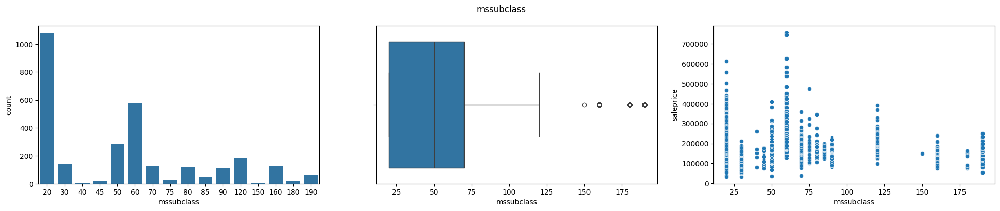

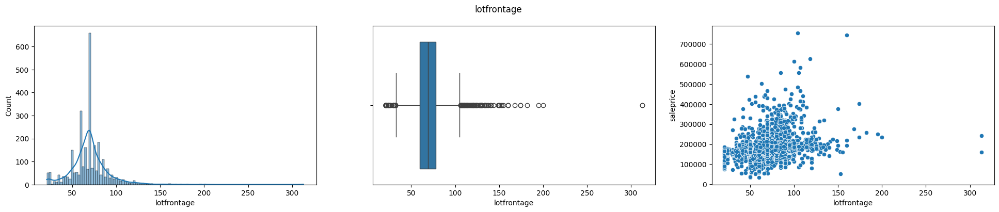

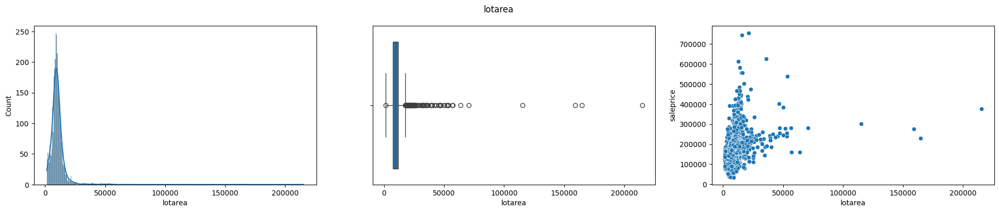

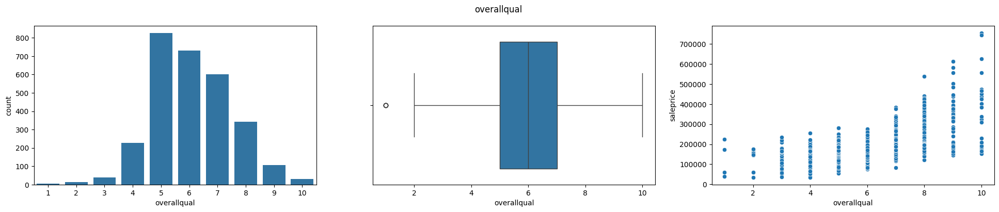

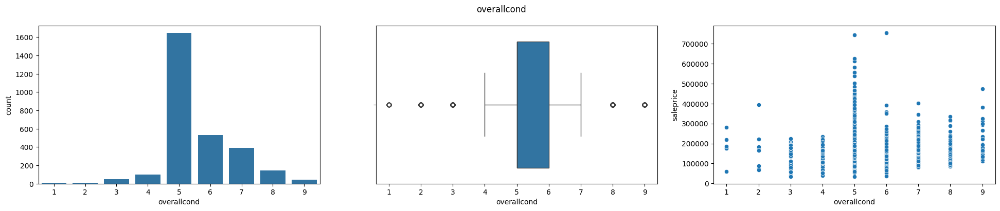

...

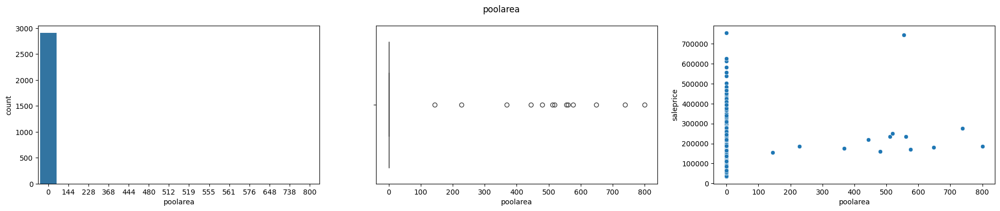

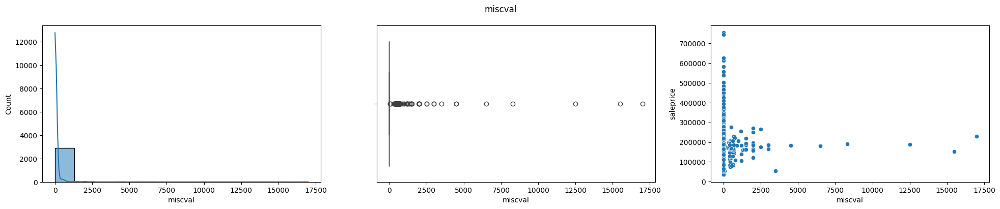

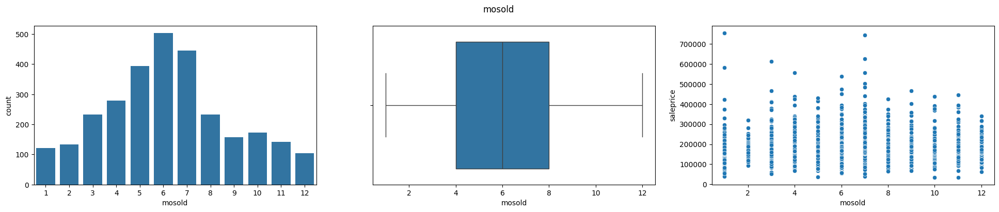

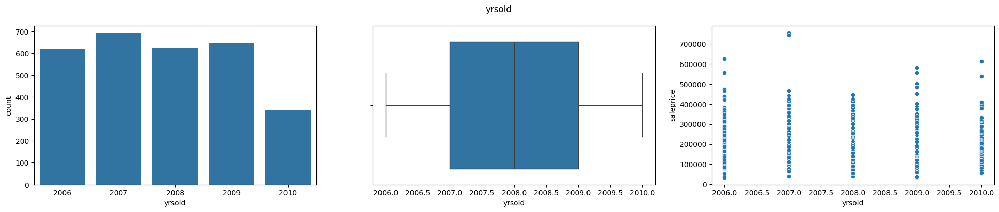

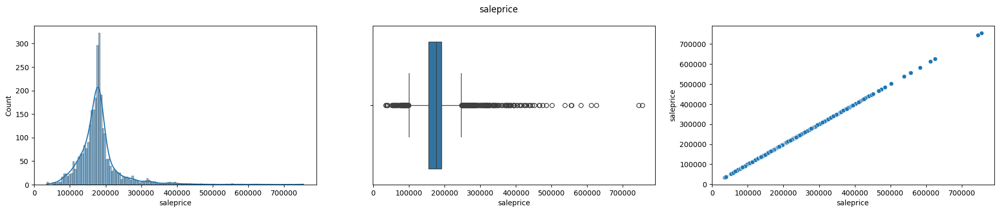

In [ ]:
numeric_cols = [col for col in home.columns if home[col].dtype in ['int64', 'float64']]
for col in numeric_cols:
  fig, axes = plt.subplots(1, 3, figsize=(24, 4))
  if home[col].nunique() <=20:
    sns.countplot(data=home, x=col, ax=axes[0])
  else:
    sns.histplot(data=home, x=col, ax=axes[0], kde=True)
  sns.boxplot(data=home, x=col, ax=axes[1])
  sns.scatterplot(x=col, y='saleprice', data=home, ax=axes[2])
  fig.suptitle(f"{col}")
  plt.show()

>After review we will remove the outliers that shown on scatter plot between grlivarea and saleprice that located at > 4000 on grlivarea column and > 700000 on saleprice column

##**2.3. Heatmap**

<Axes: >

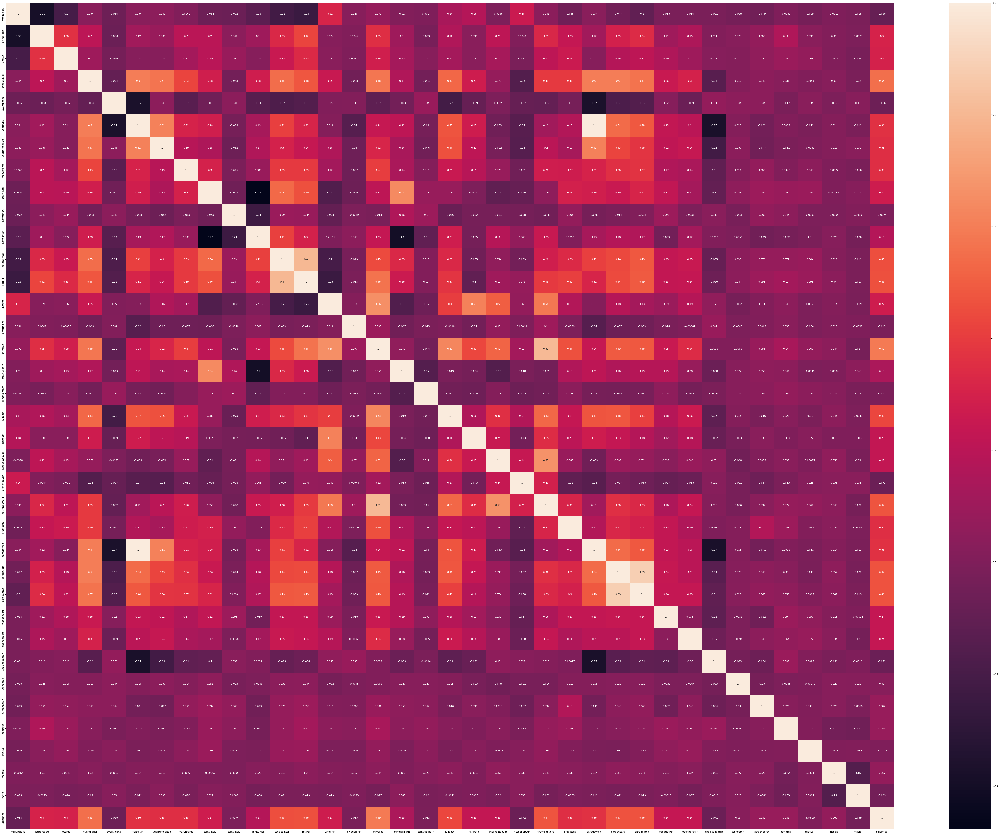

In [ ]:
plt.figure(figsize=(80,60))
sns.heatmap(home.corr(numeric_only=True),annot=True)

# **3. Feature Engineering**

##**3.1. Feature Creation**
**Note:**

> *Some feature creations are marked with 'comments' below, meaning that **the features created are not very influential** when entering the feature selection stage.*

###**a) Knowing the age of the house when sold**

In [ ]:
# home['homeage'] = home['yrsold'] - home['yearbuilt']
# home.head()

###**b) Pengkategorian tingkat rumah**

In [ ]:
# for index, row in home.iterrows():
#   if row['2ndflrsf'] > 0:
#     home.loc[index, 'houselevel'] = "Two Level"
#   else:
#     home.loc[index, 'houselevel'] = "One Level"

###**c) Total Porch Area in square feet**

In [ ]:
home['porcharea'] = home['wooddecksf']+home['openporchsf']+home['enclosedporch']+home['3ssnporch']+home['screenporch']

###**d) Total Bathroom**

In [ ]:
home['bathroom'] = home['bsmtfullbath']+(home['bsmthalfbath']*0.5)+home['fullbath']+(home['halfbath']*0.5)
home.drop(columns=['bsmtfullbath', 'bsmthalfbath', 'fullbath', 'halfbath'], axis=1)

,mssubclass,mszoning,lotfrontage,lotarea,street,alley,lotshape,landcontour,utilities,lotconfig,...,fence,miscfeature,miscval,mosold,yrsold,saletype,salecondition,saleprice,porcharea,bathroom
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,0,Reg,Lvl,AllPub,Inside,...,0,0,0,2,2008,WD,Normal,208500.000000,61,3.5
2,20,RL,80.0,9600,Pave,0,Reg,Lvl,AllPub,FR2,...,0,0,0,5,2007,WD,Normal,181500.000000,298,2.5
3,60,RL,68.0,11250,Pave,0,IR1,Lvl,AllPub,Inside,...,0,0,0,9,2008,WD,Normal,223500.000000,42,3.5
4,70,RL,60.0,9550,Pave,0,IR1,Lvl,AllPub,Corner,...,0,0,0,2,2006,WD,Abnorml,140000.000000,307,2.0
5,60,RL,84.0,14260,Pave,0,IR1,Lvl,AllPub,FR2,...,0,0,0,12,2008,WD,Normal,250000.000000,276,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2915,160,RM,21.0,1936,Pave,0,Reg,Lvl,AllPub,Inside,...,0,0,0,6,2006,WD,Normal,167081.220949,0,1.5
2916,160,RM,21.0,1894,Pave,0,Reg,Lvl,AllPub,Inside,...,0,0,0,4,2006,WD,Abnorml,164788.778231,24,1.5
2917,20,RL,160.0,20000,Pave,0,Reg,Lvl,AllPub,Inside,...,0,0,0,9,2006,WD,Abnorml,219222.423400,474,2.0


###**e) Recommendation Home for each Social Class**

In [ ]:

# for i, row in home.iterrows():
#   if row['saleprice'] <= 155000:
#     home.loc[i, 'suitablefor'] = "Lower Class"
#   elif row['saleprice'] >= 240000:
#     home.loc[i, 'suitablefor'] = "Upper Class"
#   else:
#     home.loc[i, 'suitablefor'] = "Middle Class"

###**f) Season do people buy houses**

In [ ]:
# for i, row in home.iterrows():
#   if row['mosold'] <= 3:
#     home.loc[i, 'season'] = "Spring"
#   elif 4 <= row['mosold'] <= 6:
#     home.loc[i, 'season'] = "Summer"
#   elif 7 <= row['mosold'] <= 9:
#     home.loc[i, 'season'] = "Autumn"
#   elif 10 <= row['mosold'] <= 12:
#     home.loc[i, 'season'] = "Winter"

###**g) Buy a house in winter by finding that it has a fireplace**

In [ ]:

# condition = (home['season'] == 'Winter') & (home['fireplaces'] == 1)
# home['winterforfireplace'] = condition.map({True: 1, False: 0})

###**h) Rehab Action**

In [ ]:
# for i, row in home.iterrows():
#   if 1 <= row['overallcond'] <= 4:
#     home.loc[i, 'rehab'] = "Need"
#   elif 5 <= row['overallcond'] <= 7:
#     home.loc[i, 'rehab'] = "Optional"
#   elif 8 <= row['overallcond'] <= 10:
#     home.loc[i, 'rehab'] = "Good"

###**i) Total outdoor space**

In [ ]:
home['outdoorspace'] = (home['1stflrsf'] + home['2ndflrsf']) / home['totrmsabvgrd']

###**j) Total Building Area**

In [ ]:
home['totsqfbldg'] = home['grlivarea'] + home['totalbsmtsf']

##**3.2. Transformation**

###**a) Encoding some columns that has label values**
  Do some inspection on the label columns, in order to know what encoder that suits best to the dataset

In [ ]:
home.select_dtypes('object').nunique()

mszoning          6
street            2
alley             3
lotshape          4
landcontour       4
utilities         3
lotconfig         5
landslope         3
neighborhood     25
condition1        9
condition2        8
bldgtype          5
housestyle        8
roofstyle         6
roofmatl          8
exterior1st      16
exterior2nd      17
masvnrtype        4
exterqual         4
extercond         5
foundation        6
bsmtqual          5
bsmtcond          5
bsmtexposure      5
bsmtfintype1      7
bsmtfintype2      7
heating           6
heatingqc         5
centralair        2
electrical        6
kitchenqual       5
functional        8
fireplacequ       6
garagetype        7
garagefinish      4
garagequal        6
garagecond        6
paveddrive        3
poolqc            4
fence             5
miscfeature       5
saletype         10
salecondition     6
dtype: int64

>we will split for Ordinal Columns and Nominal Columns, for Ordinal Columns using OrdinalEncoder, and Nominal Columns using LabelEnconder

In [ ]:
!pip install category-encoders

In [ ]:
import pandas as pd
from category_encoders import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder

def encode_categorical_columns(train_data):
    categorical_cols = [col for col in train_data.columns if train_data[col].dtype == 'object']
    ordinal_features = ["lotshape", "overallqual", "overallcond", "exterqual", "extercond", "bsmtqual", "bsmtcond", "bsmtexposure", "bsmtfintype1", "bsmtfintype2", "heatingqc", "electrical",
                        "kitchenqual", "fireplacequ", "garagequal", "garagecond", "poolqc", "fence"]
    not_ordinal_features_cols = [col for col in categorical_cols if col not in ordinal_features]

    for col in categorical_cols:
        train_data[col] = train_data[col].astype('str')

    encoder = OrdinalEncoder(cols=ordinal_features)
    train_data = encoder.fit_transform(train_data)

    for col in not_ordinal_features_cols:
        encoder = LabelEncoder()
        train_data[col] = encoder.fit_transform(train_data[col])

    return train_data

home = encode_categorical_columns(home.copy())
home.head()

,mssubclass,mszoning,lotfrontage,lotarea,street,alley,lotshape,landcontour,utilities,lotconfig,...,miscval,mosold,yrsold,saletype,salecondition,saleprice,porcharea,bathroom,outdoorspace,totsqfbldg
Id,,,,,,,,,,,,,,,,,,,,,
1,60,4,65.0,8450,1,0,1,3,1,4,...,0,2,2008,9,4,208500.0,61,3.5,213.750000,2566.0
2,20,4,80.0,9600,1,0,1,3,1,2,...,0,5,2007,9,4,181500.0,298,2.5,210.333333,2524.0
3,60,4,68.0,11250,1,0,2,3,1,4,...,0,9,2008,9,4,223500.0,42,3.5,297.666667,2706.0
4,70,4,60.0,9550,1,0,2,3,1,0,...,0,2,2006,9,0,140000.0,307,2.0,245.285714,2473.0
5,60,4,84.0,14260,1,0,2,3,1,2,...,0,12,2008,9,4,250000.0,276,3.5,244.222222,3343.0


# **4. Data Preparation - Final**

###**4.1. Remove Outliers**

> follow-up result on the EDA step that we will remove the outliers that shown on scatter plot between grlivarea and saleprice that located at > 4000 on grlivarea column and > 700000 on saleprice column

In [ ]:
home = home[home['grlivarea'] <= 4000]
home = home[home['totsqfbldg'] <= 6000]

# **5. Exploratory Data Analysis - Final**

##**5.1. Visualize the Outliers using Boxplot, Visualize distribution of the data using Histogram and Visualize Correlation between many columns with saleprice using Scatter Plot**

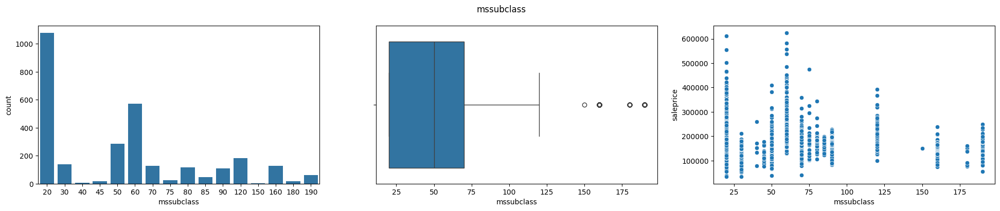

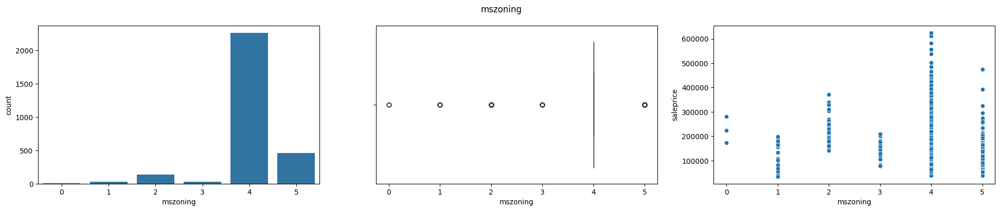

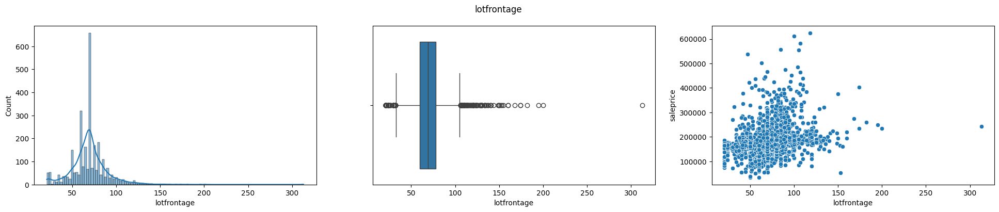

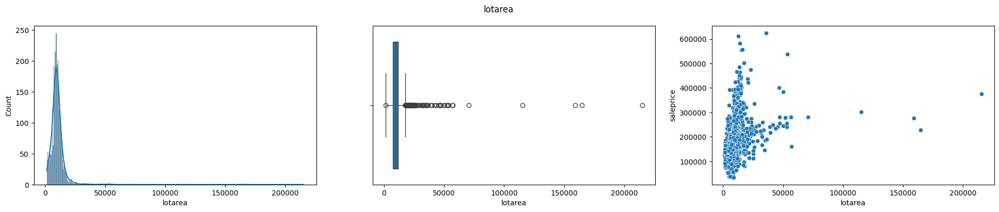

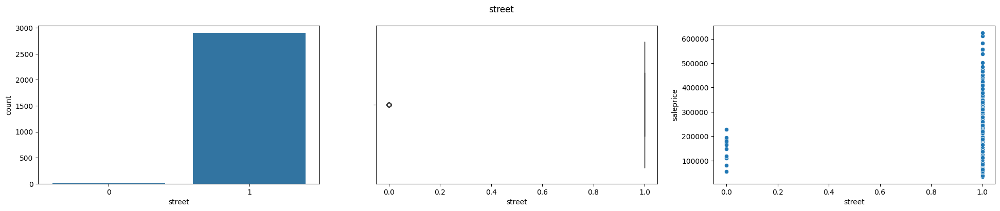

...

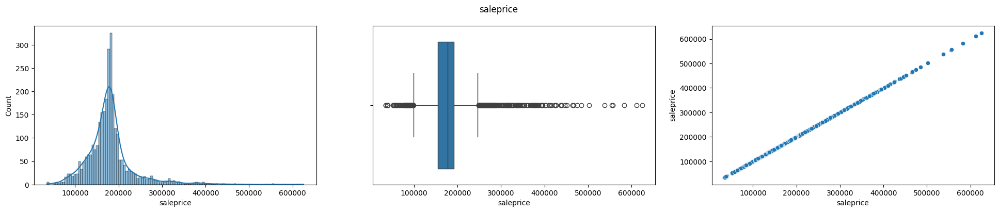

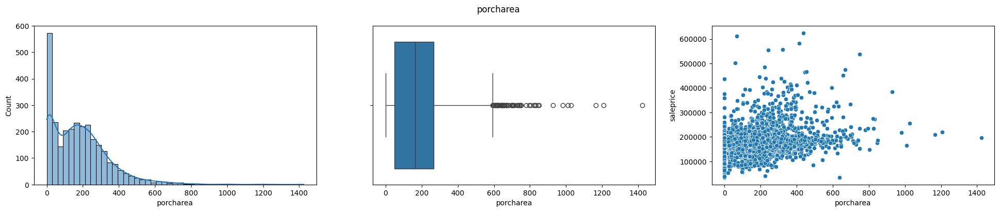

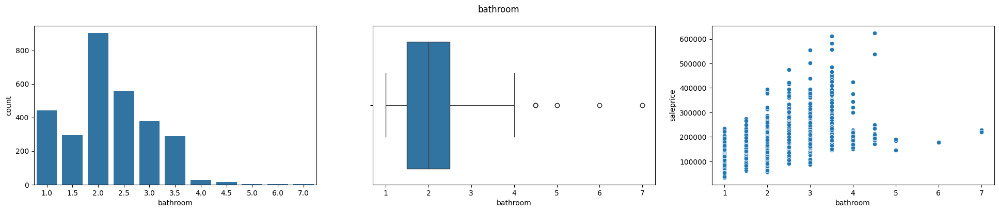

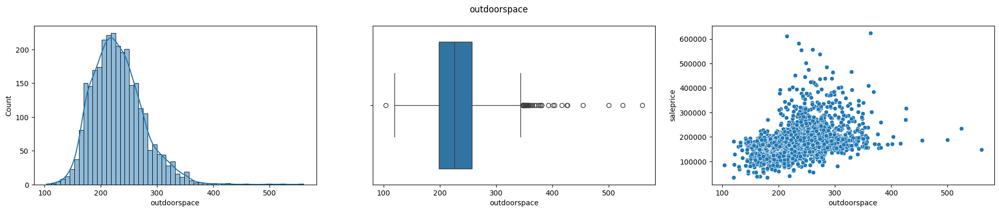

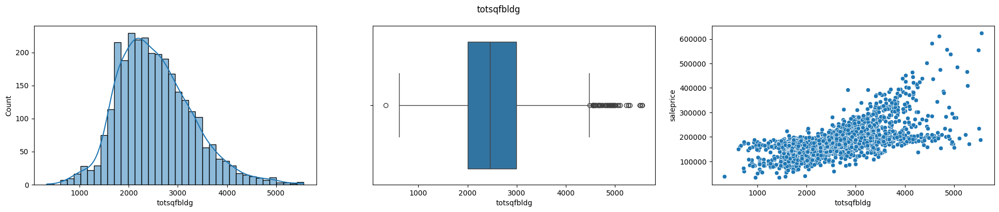

In [ ]:
numeric_cols = [col for col in home.columns if home[col].dtype in ['int64', 'float64']]
for col in numeric_cols:
  fig, axes = plt.subplots(1, 3, figsize=(24, 4))
  if home[col].nunique() <=20:
    sns.countplot(data=home, x=col, ax=axes[0])
  else:
    sns.histplot(data=home, x=col, ax=axes[0], kde=True)
  sns.boxplot(data=home, x=col, ax=axes[1])
  sns.scatterplot(x=col, y='saleprice', data=home, ax=axes[2])
  fig.suptitle(f"{col}")
  plt.show()

>After some review of each columns about how they perform by itself (bivariate analysis) and perform by saleprice column (multivariate analysis), we can say that many outliers that still hard to remove, because after review if we delete many outliers left, we will deleted half of the record that will effecting the model that created later

##**5.2. Heatmap**

In [ ]:
plt.figure(figsize=(160,120))
sns.heatmap(home.corr(numeric_only=True),annot=True)

<Axes: >

> After review, `grlivarea` column have a strong relationship between `saleprice` column and these 2 columns will become a pilot for visualize the result

# **6. Feature Engineering - Final**

##**6.1. Feature Selection**

- **Pop the target column**

In [ ]:
X = home.copy()
y = X.pop('saleprice')

- **Split the dataset into train and test**

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=42)

- **Mutual Info Regression**

In [ ]:
X1 = X_train.copy()
y1 = y_train.copy()
from sklearn.feature_selection import mutual_info_regression
discrete_features = [pd.api.types.is_integer_dtype(t) for t in X1.dtypes]
mi_scores = mutual_info_regression(X1, y1, discrete_features=discrete_features, random_state=0)
mi_scores = pd.Series(mi_scores, name="MI Scores", index=X1.columns)

Text(0.5, 1.0, 'Mutual Information Scores')

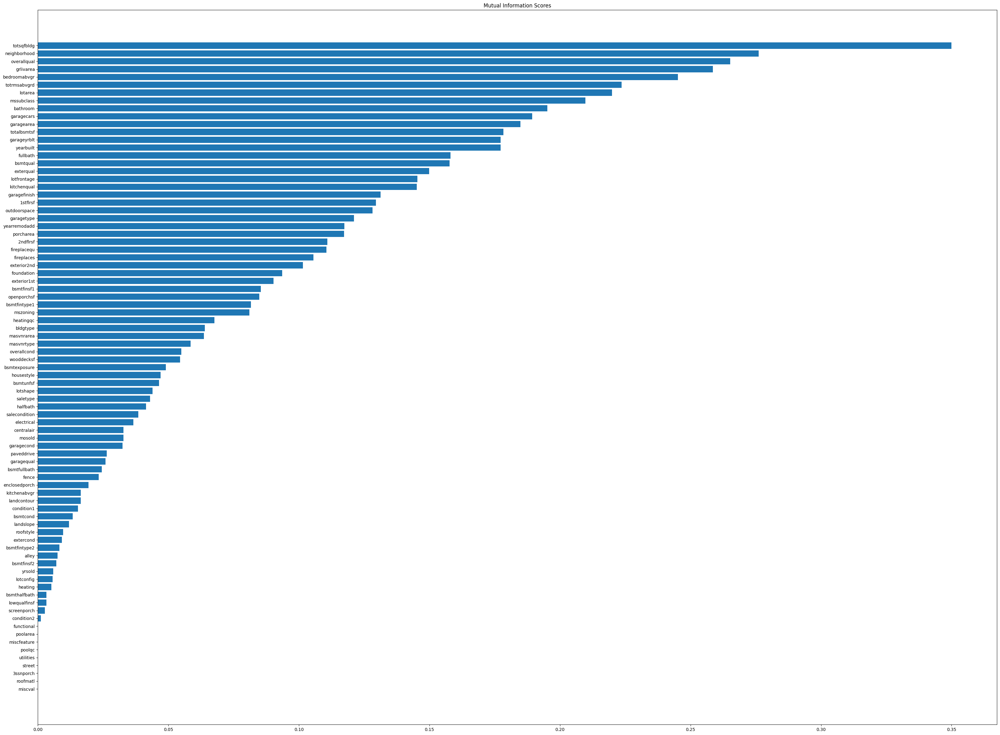

In [ ]:
scores = mi_scores.sort_values(ascending=True)
width = np.arange(len(scores))
ticks = list(scores.index)
plt.figure(figsize=(40,30))
plt.barh(width, scores)
plt.yticks(width, ticks)
plt.title("Mutual Information Scores")

> We see that there are 8 columns that will not effect the regression result, so the result we will not bring that 8 columns to the modelling stage

In [ ]:
mi_threshold = 0
keep_columns = []
for col, mi_score in mi_scores.items():
    if mi_score > mi_threshold:
        keep_columns.append(col)

X_train = X_train[keep_columns]
X_test = X_test[keep_columns]

# **7. Machine Learning**

The Decision for what Machine Learning Algorithm that going to use on this dataset is using Regression that Robust to outliers, here we want to compare some dataset and find the best algorithm for this dataset

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import HuberRegressor, RANSACRegressor, TheilSenRegressor
from sklearn.model_selection import RandomizedSearchCV, KFold, cross_val_score
from sklearn.metrics import mean_absolute_error
from scipy.stats import uniform, poisson
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import random

##**7.1. DecisionTreeRegressor**

###**a) Split for train and test in DecisionTreeRegressor**

In [ ]:
X_train_DTR = X_train.copy()
X_test_DTR = X_test.copy()
y_train_DTR = y_train.copy()
y_test_DTR = y_test.copy()

###**b) Modelling**

In [ ]:
model_DTR = DecisionTreeRegressor(random_state=42)
model_DTR.fit(X_train_DTR, y_train_DTR)

DecisionTreeRegressor(random_state=42)

In [ ]:
y_pred_DTR_b = model_DTR.predict(X_test_DTR)

###**c) Score Dataset Before HyperParameter Tuning**

In [ ]:
mae_DTR_b = mean_absolute_error(y_test_DTR, y_pred_DTR_b)
print("MAE: ", mae_DTR_b)

MAE:  36277.07695809592


###**d) HyperParameter Tuning**

In [ ]:
# param_DTR = {'criterion':['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
#               'splitter':['best', 'random'],
#               'max_depth': range(3, 20),
#               'min_samples_split': range(2, 10),
#               'min_samples_leaf': range(1, 10),
#               'max_features': ['auto', 'sqrt', 'log2'],
#               'max_leaf_nodes':poisson(mu=15,loc=5)}

# r2 = RandomizedSearchCV(DecisionTreeRegressor(), param_DTR, cv=5, n_iter=100, random_state=42, n_jobs=-1)

# r2.fit(X_train_DTR, y_train_DTR)

# rgr_params2 = r2.best_params_
# rgr_params2

{'criterion': 'poisson',
 'max_depth': 4,
 'max_features': 'auto',
 'max_leaf_nodes': 12,
 'min_samples_leaf': 8,
 'min_samples_split': 6,
 'splitter': 'best'}

In [ ]:
model_DTR1 = DecisionTreeRegressor(random_state=42, criterion='poisson', max_depth=4, max_features='auto',max_leaf_nodes=12, min_samples_leaf=8, min_samples_split=6, splitter='best')
model_DTR1.fit(X_train_DTR, y_train_DTR)

DecisionTreeRegressor(criterion='poisson', max_depth=4, max_features='auto',
                      max_leaf_nodes=12, min_samples_leaf=8,
                      min_samples_split=6, random_state=42)

In [ ]:
y_pred_DTR_a = model_DTR1.predict(X_test_DTR)

###**e) Score Dataset After HyperParameter Tuning**

In [ ]:
mae_DTR_a = mean_absolute_error(y_test_DTR, y_pred_DTR_a)
print("MAE: ", mae_DTR_a)

MAE:  29166.738335655413


###**f) Visualization**

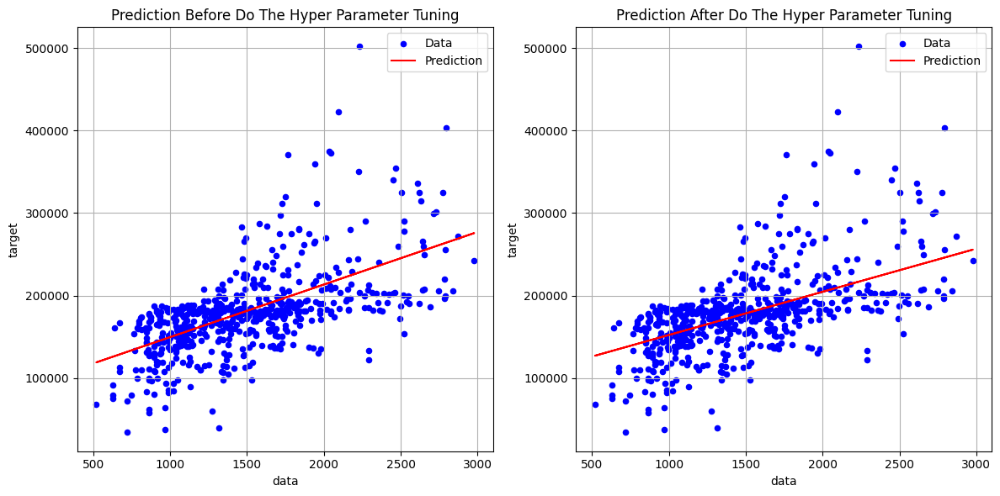

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].scatter(X_test_DTR['grlivarea'], y_test_DTR, s=20, color="blue", label="Data")
axes[0].plot(X_test_DTR['grlivarea'], np.poly1d(np.polyfit(X_test_DTR['grlivarea'], y_pred_DTR_b, 1))(X_test_DTR['grlivarea']), color='red', label="Prediction")
axes[0].set_xlabel("data")
axes[0].set_ylabel("target")
axes[0].set_title("Prediction Before Do The Hyper Parameter Tuning")
axes[0].legend()
axes[0].grid(True)

axes[1].scatter(X_test_DTR['grlivarea'], y_test_DTR, s=20, color="blue", label="Data")
axes[1].plot(X_test_DTR['grlivarea'], np.poly1d(np.polyfit(X_test_DTR['grlivarea'], y_pred_DTR_a, 1))(X_test_DTR['grlivarea']), color='red', label="Prediction")
axes[1].set_xlabel("data")
axes[1].set_ylabel("target")
axes[1].set_title("Prediction After Do The Hyper Parameter Tuning")
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()

plt.show()

##**7.2. RandomForestRegressor**

###**a) Split for train and test in RandomForestRegressor**

In [ ]:
X_train_RFR = X_train.copy()
X_test_RFR = X_test.copy()
y_train_RFR = y_train.copy()
y_test_RFR = y_test.copy()

###**b) Modelling**

In [ ]:
model_RFR = RandomForestRegressor(random_state=42)
model_RFR.fit(X_train_RFR, y_train_RFR)

RandomForestRegressor(random_state=42)

In [ ]:
y_pred_RFR_b = model_RFR.predict(X_test_RFR)

###**c) Model Performance Score Before HyperParameter Tuning** ###

In [ ]:
mae_RFR_b = mean_absolute_error(y_test_RFR, y_pred_RFR_b)
print("MAE: ", mae_RFR_b)

MAE:  28032.499689849858


###**d) HyperParameter Tuning**

In [ ]:
# param_RFR = {'criterion':['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
#              'n_estimators': range(100, 1000, 100),
#              'max_features': ["auto", "sqrt", "log2"],
#              'max_depth': range(3, 20),
#              'min_samples_split': range(2, 10),
#              'min_samples_leaf': range(1, 10)}

# rcv_RFR = RandomizedSearchCV(model_RFR, param_RFR, n_iter = 100, cv = 5, random_state=42, verbose=2, n_jobs=-1)

# rcv_RFR.fit(X_train_RFR, y_train_RFR)

# rcv_params = rcv_RFR.best_params_
# rcv_params

Fitting 5 folds for each of 100 candidates, totalling 500 fits


{'n_estimators': 800,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'log2',
 'max_depth': 18,
 'criterion': 'squared_error'}

In [ ]:
model_RFR1 = RandomForestRegressor(random_state=42, n_estimators= 200, min_samples_split= 7, min_samples_leaf= 3, max_features= 'sqrt', max_depth= 19, bootstrap=False)
model_RFR1.fit(X_train_RFR, y_train_RFR)

RandomForestRegressor(bootstrap=False, max_depth=19, max_features='sqrt',
                      min_samples_leaf=3, min_samples_split=7, n_estimators=200,
                      random_state=42)

In [ ]:
y_pred_RFR_a = model_RFR1.predict(X_test_RFR)

###**e) Model Performance Score After HyperParameter Tuning**

In [ ]:
mae_RFR_a = mean_absolute_error(y_test_RFR, y_pred_RFR_a)
print("MAE: ", mae_RFR_a)

MAE:  28338.27273794905


###**f) Visualization**

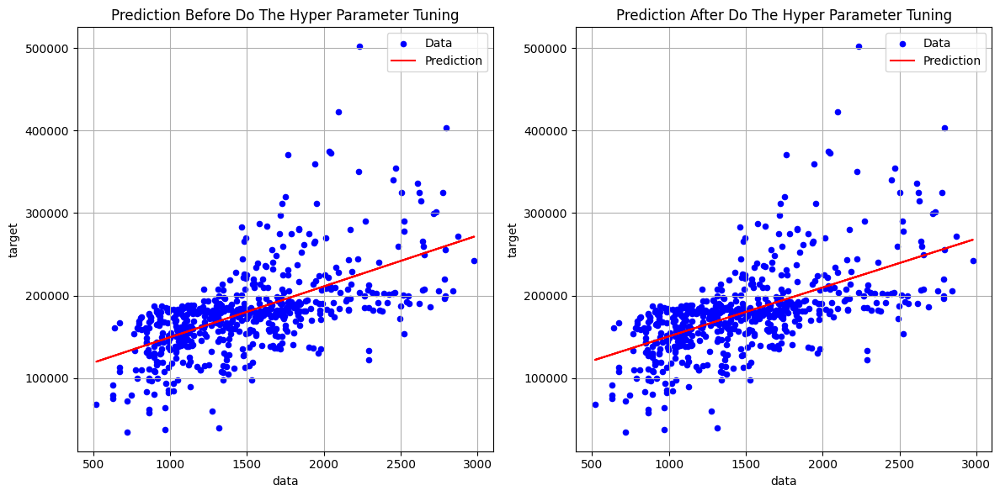

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].scatter(X_test_RFR['grlivarea'], y_test_RFR, s=20, color="blue", label="Data")
axes[0].plot(X_test_RFR['grlivarea'], np.poly1d(np.polyfit(X_test_RFR['grlivarea'], y_pred_RFR_b, 1))(X_test_RFR['grlivarea']), color='red', label="Prediction")
axes[0].set_xlabel("data")
axes[0].set_ylabel("target")
axes[0].set_title("Prediction Before Do The Hyper Parameter Tuning")
axes[0].legend()
axes[0].grid(True)

axes[1].scatter(X_test_RFR['grlivarea'], y_test_RFR, s=20, color="blue", label="Data")
axes[1].plot(X_test_RFR['grlivarea'], np.poly1d(np.polyfit(X_test_RFR['grlivarea'], y_pred_RFR_a, 1))(X_test_RFR['grlivarea']), color='red', label="Prediction")
axes[1].set_xlabel("data")
axes[1].set_ylabel("target")
axes[1].set_title("Prediction After Do The Hyper Parameter Tuning")
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()

plt.show()


##**7.3. XGBRegressor**

### **a) Split for train and test in XGBRegressor**

In [ ]:
X_train_XGBR = X_train.copy()
X_test_XGBR = X_test.copy()
y_train_XGBR = y_train.copy()
y_test_XGBR = y_test.copy()

###**b) Modelling**

In [ ]:
model_XGBR = XGBRegressor(random_state=42)
model_XGBR.fit(X_train_XGBR, y_train_XGBR)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
y_pred_XGBR_b = model_XGBR.predict(X_test_XGBR)

###**c) Model Performance Score Before HyperParameter Tuning**

In [ ]:
mae_XGBR_b = mean_absolute_error(y_test_XGBR, y_pred_XGBR_b)
print("MAE: ", mae_XGBR_b)

MAE:  29063.237079184215


###**d) HyperParameter Tuning**

In [ ]:
# param_xgbr = {'learning_rate': uniform(),
#                'max_depth': range(10),
#                'min_child_weight': range(10),
#                'subsample': [0.5, 0.7],
#                'colsample_bytree': [0.5, 0.7],
#                'n_estimators' : range(50, 1000, 50),
#                'reg_alpha': range(10),
#                'reg_lambda': range(10),
#     }

# rcv_XGBR = RandomizedSearchCV(model_XGBR, param_xgbr, n_iter = 100, cv = 5, random_state=42)

# rcv_XGBR.fit(X_train_XGBR, y_train_XGBR)

# xgbr_params = rcv_XGBR.best_params_
# xgbr_params

{'colsample_bytree': 0.7,
 'learning_rate': 0.012154474689816341,
 'max_depth': 4,
 'min_child_weight': 5,
 'n_estimators': 550,
 'reg_alpha': 4,
 'reg_lambda': 3,
 'subsample': 0.5}

In [ ]:
model_XGBR1 = XGBRegressor(random_state=42, subsample= 0.7, n_estimators= 700, min_child_weight= 0, max_depth= 4, learning_rate= 0.014393488629755868, colsample_bytree= 0.7, reg_alpha=3, reg_lambda=4)
model_XGBR1.fit(X_train_XGBR, y_train_XGBR)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.014393488629755868,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=0, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=700, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
y_pred_XGBR_a = model_XGBR1.predict(X_test_XGBR)

###**e) Model Performance Score After HyperParameter Tuning**

In [ ]:
mae_XGBR_a = mean_absolute_error(y_test_XGBR, y_pred_XGBR_a)
print("MAE: ", mae_XGBR_a)

MAE:  28210.365591784066


###**f) Visualization**

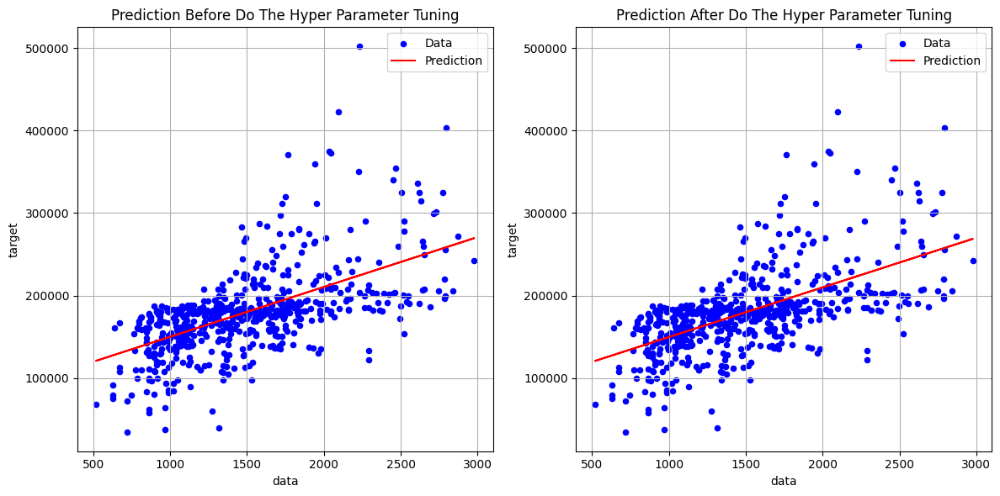

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].scatter(X_test_XGBR['grlivarea'], y_test_XGBR, s=20, color="blue", label="Data")
axes[0].plot(X_test_XGBR['grlivarea'], np.poly1d(np.polyfit(X_test_XGBR['grlivarea'], y_pred_XGBR_b, 1))(X_test_XGBR['grlivarea']), color='red', label="Prediction")
axes[0].set_xlabel("data")
axes[0].set_ylabel("target")
axes[0].set_title("Prediction Before Do The Hyper Parameter Tuning")
axes[0].legend()
axes[0].grid(True)

axes[1].scatter(X_test_XGBR['grlivarea'], y_test_XGBR, s=20, color="blue", label="Data")
axes[1].plot(X_test_XGBR['grlivarea'], np.poly1d(np.polyfit(X_test_XGBR['grlivarea'], y_pred_XGBR_a, 1))(X_test_XGBR['grlivarea']), color='red', label="Prediction")
axes[1].set_xlabel("data")
axes[1].set_ylabel("target")
axes[1].set_title("Prediction After Do The Hyper Parameter Tuning")
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()

plt.show()


##**7.4. LGBMRegressor**


###**a) Split for train and test in LGBMRegressor**

In [ ]:
X_train_LGBMR = X_train.copy()
X_test_LGBMR = X_test.copy()
y_train_LGBMR = y_train.copy()
y_test_LGBMR = y_test.copy()

###**b) Modelling**

In [ ]:
model_LGBMR = LGBMRegressor(random_state=42)
model_LGBMR.fit(X_train_LGBMR, y_train_LGBMR)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4427
[LightGBM] [Info] Number of data points in the train set: 2330, number of used features: 73
[LightGBM] [Info] Start training from score 179777.325972


LGBMRegressor(random_state=42)

In [ ]:
y_pred_LGBMR_b = model_LGBMR.predict(X_test_LGBMR)

###**c) Model Performance Score Before HyperParameter Tuning**

In [ ]:
mae_LGBMR_b = mean_absolute_error(y_test_LGBMR, y_pred_LGBMR_b)
print("MAE: ", mae_LGBMR_b)

MAE:  29206.91250312883


###**d) HyperParameter Tuning**

In [ ]:
# param_lgbmr = {
#     'learning_rate': uniform(),
#     'n_estimators': range(50, 1000, 50),
#     'num_leaves': range(50, 500, 50),
#     'max_depth': range(5, 50, 5),
#     'min_data_in_leaf': range(10, 100, 10),
#     'colsample_bytree': [0.6, 0.8, 1.0],
#     'subsample': [0.8, 1.0]
# }

# rcv_LGBMR = RandomizedSearchCV(estimator=model_LGBMR, param_distributions=param_lgbmr, cv=5, scoring='neg_mean_squared_error', n_iter=100)

# rcv_LGBMR.fit(X_train_LGBMR, y_train_LGBMR)

# lgbm_params = rcv_LGBMR.best_params_
# lgbm_params

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

{'colsample_bytree': 0.6,
 'learning_rate': 0.016069447712954044,
 'max_depth': 35,
 'min_data_in_leaf': 30,
 'n_estimators': 500,
 'num_leaves': 450,
 'subsample': 0.8}

In [ ]:
model_LGBMR1 = LGBMRegressor(random_state=42, subsample= 0.8, num_leaves= 450, n_estimators= 500, min_data_in_leaf=30, max_depth= 35, learning_rate= 0.016069447712954044, colsample_bytree= 0.6)
model_LGBMR1.fit(X_train_LGBMR, y_train_LGBMR)

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4427
[LightGBM] [Info] Number of data points in the train set: 2330, number of used features: 73
[LightGBM] [Info] Start training from score 179777.325972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

LGBMRegressor(colsample_bytree=0.6, learning_rate=0.016069447712954044,
              max_depth=35, min_data_in_leaf=30, n_estimators=500,
              num_leaves=450, random_state=42, subsample=0.8)

In [ ]:
y_pred_LGBMR_a = model_LGBMR1.predict(X_test_LGBMR)

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30


###**e) Model Performance Score After HyperParameter Tuning**

In [ ]:
mae_LGBMR_a = mean_absolute_error(y_test_LGBMR, y_pred_LGBMR_a)
print("MAE: ", mae_LGBMR_a)

MAE:  28634.572501115257


###**f) Visualization**

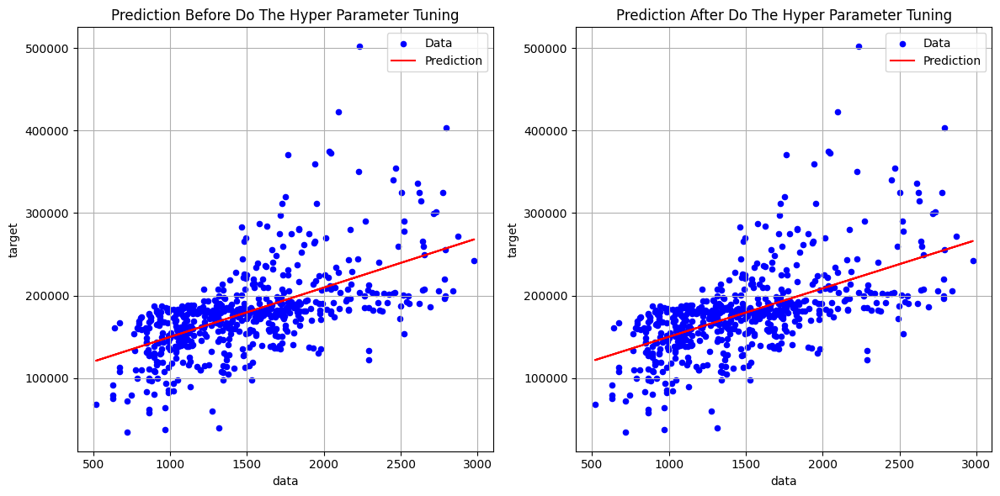

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].scatter(X_test_LGBMR['grlivarea'], y_test_LGBMR, s=20, color="blue", label="Data")
axes[0].plot(X_test_LGBMR['grlivarea'], np.poly1d(np.polyfit(X_test_LGBMR['grlivarea'], y_pred_LGBMR_b, 1))(X_test_LGBMR['grlivarea']), color='red', label="Prediction")
axes[0].set_xlabel("data")
axes[0].set_ylabel("target")
axes[0].set_title("Prediction Before Do The Hyper Parameter Tuning")
axes[0].legend()
axes[0].grid(True)

axes[1].scatter(X_test_LGBMR['grlivarea'], y_test_LGBMR, s=20, color="blue", label="Data")
axes[1].plot(X_test_LGBMR['grlivarea'], np.poly1d(np.polyfit(X_test_LGBMR['grlivarea'], y_pred_LGBMR_a, 1))(X_test_LGBMR['grlivarea']), color='red', label="Prediction")
axes[1].set_xlabel("data")
axes[1].set_ylabel("target")
axes[1].set_title("Prediction After Do The Hyper Parameter Tuning")
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()

plt.show()


##**7.5. RANSACRegressor**

###**a) Split for train and test in RANSACRegressor**

In [ ]:
X_train_RAN = X_train.copy()
X_test_RAN = X_test.copy()
y_train_RAN = y_train.copy()
y_test_RAN = y_test.copy()

###**b) Modelling**

In [ ]:
model_RAN = RANSACRegressor(random_state=42)
model_RAN.fit(X_train_RAN, y_train_RAN)

RANSACRegressor(random_state=42)

In [ ]:
y_pred_RAN_b = model_RAN.predict(X_test_RAN)

###**c) Model Performance Score Before HyperParameter Tuning**

In [ ]:
mae_RAN_b = mean_absolute_error(y_test_RAN, y_pred_RAN_b)
print("MAE: ", mae_RAN_b)

MAE:  55917.87703111534


###**d) HyperParameter Tuning**

In [ ]:
# param_ran = {'min_samples': range(1, 101),
#              'max_trials': range(10, 1001),
#              'stop_probability': uniform(),
#              'residual_threshold': [0.5, 1.0, 2.0, 3.0],
#              'loss': ['absolute_error', 'squared_error']
# }

# rcv_RAN = RandomizedSearchCV(model_RAN, param_ran, n_iter = 100, cv = 5, random_state=42)

# rcv_RAN.fit(X_train_RAN, y_train_RAN)

# ran_params = rcv_RAN.best_params_
# ran_params

{'loss': 'squared_error',
 'max_trials': 514,
 'min_samples': 3,
 'residual_threshold': 0.5,
 'stop_probability': 0.6075448519014384}

In [ ]:
model_RAN1 = RANSACRegressor(loss= 'absolute_error', max_trials= 514, min_samples= 3, residual_threshold= 0.5, stop_probability= 0.6075448519014384)
model_RAN1.fit(X_train_RAN, y_train_RAN)

RANSACRegressor(max_trials=514, min_samples=3, residual_threshold=0.5,
                stop_probability=0.6075448519014384)

In [ ]:
y_pred_RAN_a = model_RAN1.predict(X_test_RAN)

###**e) Model Performance Score After HyperParameter Tuning**

In [ ]:
mae_RAN_a = mean_absolute_error(y_test_RAN, y_pred_RAN_a)
print("MAE: ", mae_RAN_a)

MAE:  35823.62713784148


###**f) Visualization**

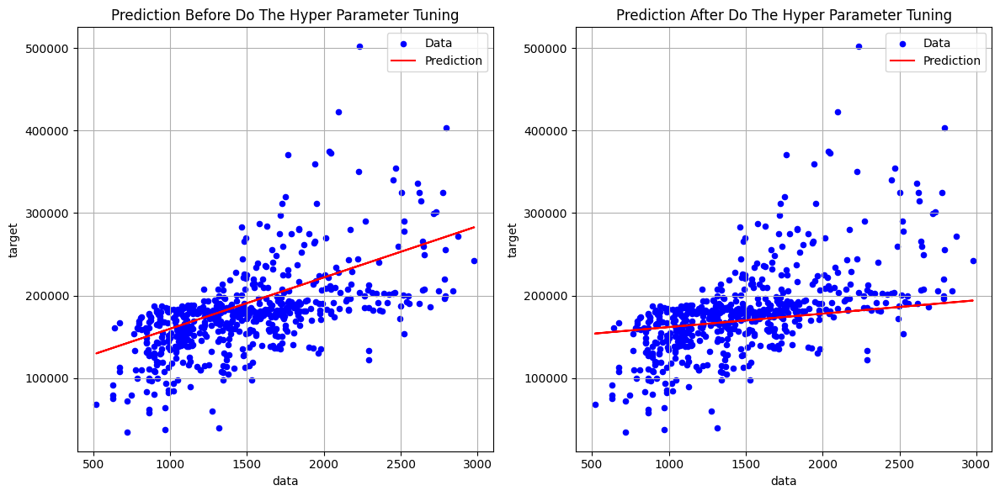

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].scatter(X_test_RAN['grlivarea'], y_test_RAN, s=20, color="blue", label="Data")
axes[0].plot(X_test_RAN['grlivarea'], np.poly1d(np.polyfit(X_test_RAN['grlivarea'], y_pred_RAN_b, 1))(X_test_RAN['grlivarea']), color='red', label="Prediction")
axes[0].set_xlabel("data")
axes[0].set_ylabel("target")
axes[0].set_title("Prediction Before Do The Hyper Parameter Tuning")
axes[0].legend()
axes[0].grid(True)

axes[1].scatter(X_test_RAN['grlivarea'], y_test_RAN, s=20, color="blue", label="Data")
axes[1].plot(X_test_RAN['grlivarea'], np.poly1d(np.polyfit(X_test_RAN['grlivarea'], y_pred_RAN_a, 1))(X_test_RAN['grlivarea']), color='red', label="Prediction")
axes[1].set_xlabel("data")
axes[1].set_ylabel("target")
axes[1].set_title("Prediction After Do The Hyper Parameter Tuning")
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()

plt.show()


##**7.6. HuberRegressor**

### **a) Split for train and test in HuberRegressor**

In [ ]:
X_train_hub = X_train.copy()
X_test_hub = X_test.copy()
y_train_hub = y_train.copy()
y_test_hub = y_test.copy()

###**b) Modelling**

In [ ]:
model_hub = HuberRegressor()
model_hub.fit(X_train_XGBR, y_train_XGBR)

HuberRegressor()

In [ ]:
y_pred_hub_b = model_hub.predict(X_test_hub)

###**c) Model Performance Score Before HyperParameter Tuning**

In [ ]:
mae_hub_b = mean_absolute_error(y_test_hub, y_pred_hub_b)
print("MAE: ", mae_hub_b)

MAE:  27933.002031117452


###**d) HyperParameter Tuning**

In [ ]:
# param_hub = {'max_iter' : range(50, 1000, 50),
#              'alpha': uniform(),
#              'warm_start': [True, False],
#              'fit_intercept': [True, False]
# }

# rcv_hub = RandomizedSearchCV(model_hub, param_hub, n_iter = 100, cv = 5, random_state=42)

# rcv_hub.fit(X_train_hub, y_train_hub)

# hub_params = rcv_hub.best_params_
# hub_params

{'alpha': 0.4494506741382034,
 'fit_intercept': True,
 'max_iter': 800,
 'warm_start': True}

In [ ]:
model_hub1 = HuberRegressor(epsilon=1,max_iter=800,alpha=0.4494506741382034,warm_start=True,fit_intercept=True)
model_hub1.fit(X_train_hub, y_train_hub)

HuberRegressor(alpha=0.4494506741382034, epsilon=1, max_iter=800,
               warm_start=True)

In [ ]:
y_pred_hub_a = model_hub1.predict(X_test_hub)

###**e) Model Performance Score After HyperParameter Tuning**

In [ ]:
mae_hub_a = mean_absolute_error(y_test_hub, y_pred_hub_a)
print("MAE: ", mae_hub_a)

MAE:  27864.33148068831


###**f) Visualization**

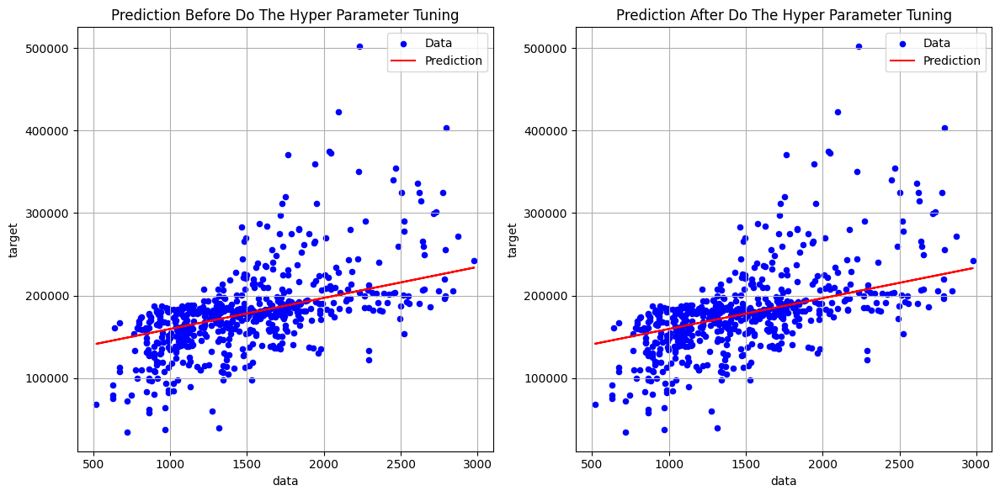

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].scatter(X_test_hub['grlivarea'], y_test_hub, s=20, color="blue", label="Data")
axes[0].plot(X_test_hub['grlivarea'], np.poly1d(np.polyfit(X_test_hub['grlivarea'], y_pred_hub_b, 1))(X_test_hub['grlivarea']), color='red', label="Prediction")
axes[0].set_xlabel("data")
axes[0].set_ylabel("target")
axes[0].set_title("Prediction Before Do The Hyper Parameter Tuning")
axes[0].legend()
axes[0].grid(True)

axes[1].scatter(X_test_hub['grlivarea'], y_test_hub, s=20, color="blue", label="Data")
axes[1].plot(X_test_hub['grlivarea'], np.poly1d(np.polyfit(X_test_hub['grlivarea'], y_pred_hub_a, 1))(X_test_hub['grlivarea']), color='red', label="Prediction")
axes[1].set_xlabel("data")
axes[1].set_ylabel("target")
axes[1].set_title("Prediction After Do The Hyper Parameter Tuning")
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()

plt.show()


##**7.7. TheilSenRegressor**

###**a) Split for train and test in TheilSenRegressor**

In [ ]:
X_train_the = X_train.copy()
X_test_the = X_test.copy()
y_train_the = y_train.copy()
y_test_the = y_test.copy()

###**b) Modelling**

In [ ]:
model_the = TheilSenRegressor()
model_the.fit(X_train_the, y_train_the)

TheilSenRegressor()

In [ ]:
y_pred_the_b = model_the.predict(X_test_the)

###**c) Model Performance Score**

In [ ]:
mae_the_b = mean_absolute_error(y_test_the, y_pred_the_b)
print("MAE: ", mae_the_b)

MAE:  30789.027715336793


In [ ]:
mae_the_a = mae_the_b

###**d) Visualization**

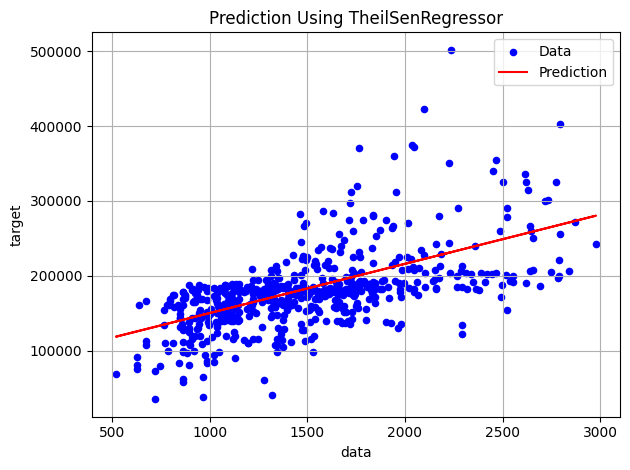

In [ ]:
plt.scatter(X_test_the['grlivarea'], y_test_the, s=20, color="blue", label="Data")
plt.plot(X_test_the['grlivarea'], np.poly1d(np.polyfit(X_test_the['grlivarea'], y_pred_the_b, 1))(X_test_the['grlivarea']), color='red', label="Prediction")
plt.xlabel("data")
plt.ylabel("target")
plt.title("Prediction Using TheilSenRegressor")
plt.legend()
plt.grid(True)

plt.tight_layout()

plt.show()


##**7.8. Summary**

In [ ]:
test_table = pd.DataFrame({
    "Model                          ":["Decision Tree Regressor", "Random Forest Regressor", "XGBRegressor", "LGBMRegressor", "RANSACRegressor", "HuberRegressor", "TheilSenRegressor"],
    "Before Hyper Parameter Tuning  ":[mae_DTR_b, mae_RFR_b, mae_XGBR_b, mae_LGBMR_b, mae_RAN_b, mae_hub_b, mae_the_b],
    "After Hyper Parameter Tuning   ":[mae_DTR_a, mae_RFR_a, mae_XGBR_a, mae_LGBMR_a, mae_RAN_a, mae_hub_a, mae_the_a],
}, index=None)
test_table

,Model,Before Hyper Parameter Tuning,After Hyper Parameter Tuning
0,Decision Tree Regressor,36277.076958,29166.738336
1,Random Forest Regressor,28032.499690,28338.272738
2,XGBRegressor,29063.237079,28210.365592
3,LGBMRegressor,29206.912503,28634.572501
4,RANSACRegressor,55917.877031,35823.627138
5,HuberRegressor,27933.002031,27864.331481
6,TheilSenRegressor,30789.027715,30789.027715


# **Conclusion**

In this notebook we want to create a model to find out the prediction of house prices in the future and we get the optimal model if predictions are made, namely using HuberRegressor with MAE score 27864.331481 after do HyperParameter Tuning